<a href="https://colab.research.google.com/github/jupirifi/KRASiAnalysis/blob/main/run_scvi_KPTracer_KRASi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install anndata
!pip install matplotlib
!pip install numpy
!pip install pandas
!pip install scanpy
!pip install scvi-tools
!pip install igraph
!pip install leidenalg
!pip install gseapy
!pip install cnmf

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.2/176.2 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.6/58.6 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.1/284.1 kB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 125.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 42.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.5/73.5 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 160.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.3/233.3 kB 19.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 7.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 641.1/641.1 kB 25.7 MB/s eta 0

In [ ]:
import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
from cnmf import cNMF

/usr/local/lib/python3.12/dist-packages/jax/_src/cloud_tpu_init.py:86: UserWarning: Transparent hugepages are not enabled. TPU runtime startup and shutdown time should be significantly improved on TPU v5e and newer. If not already set, you may need to enable transparent hugepages in your VM image (sudo sh -c "echo always > /sys/kernel/mm/transparent_hugepage/enabled")
  warnings.warn(


## Processing both datasets

---



In [ ]:
cancer_adata = sc.read_h5ad('/content/drive/MyDrive/Rotations/Jones Lab/Data/cancer_20251030.h5ad').raw.to_adata()
cancer_adata.raw = cancer_adata


KPTracer_adata = sc.read_h5ad('/content/drive/MyDrive/Rotations/Jones Lab/Data/adata_processed.nt.h5ad').raw.to_adata()
KPTracer_adata.raw= KPTracer_adata


NameError: name 'sc' is not defined

In [ ]:
cancer_adata

In [ ]:
KPTracer_adata

In [ ]:
cancer_adata.layers["counts"] = cancer_adata.X.copy()  # preserve counts
KPTracer_adata.layers["counts"] = KPTracer_adata.X.copy()
cancer_adata.obs["source"] = "KRASiExp"
KPTracer_adata.obs["source"] = "kptracerExp"
adata = ad.concat([cancer_adata, KPTracer_adata], join='outer')


del cancer_adata
del KPTracer_adata


adata


In [ ]:
for col in adata.obs.columns:
    if adata.obs[col].dtype == 'object':
        adata.obs[col] = adata.obs[col].astype(str)

In [ ]:
import os
model_name = "cancer_KPTracer_scvi_model"
data_name = "integrated_cancer_KPTracer.h5ad"
base_path = "/content/drive/MyDrive/Rotations/Jones Lab/Data/"

adata_file = os.path.join(base_path, data_name)
adata.write(adata_file, compression='gzip')

In [ ]:
#Out of RAM, using the saved data


adata= sc.read_h5ad('/content/drive/MyDrive/Rotations/Jones Lab/Data/integrated_cancer_KPTracer.h5ad').raw.to_adata()
adata.raw = adata
adata.layers["counts"] = adata.X.copy()



In [ ]:
adata

AnnData object with n_obs × n_vars = 70118 × 34329
    obs: 'CMO', 'TS-UMI', 'N_intBC', 'TS-ReadCount', 'N_unique_alleles', 'PercentUncut', 'condition', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'leiden', 'umap_density_condition', 'source', 'TS_Present', 'RNA_Present', 'MULTI', 'TS_UMI', 'NUM_INTBC', 'Lane', 'Tumor', 'SubTumor', 'ES_clone', 'genotype', 'Aging_time', 'Mouse', 'Aging_Month', 'Batch_Library', 'Batch_Harvest', 'Aging_Time', 'MetFamily', 'lentiBC', 'is_normal', 'n_counts', 'leiden_sub', 'Cluster-Name'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'

In [ ]:
adata.obs['batch_unified'] = (
    adata.obs['CMO'].astype(str)
    .replace('nan', np.nan) # Ensure string 'nan' is treated as actual NaN
    .fillna(adata.obs['Batch_Library'].astype(str))
    .replace('nan', 'Unknown')
)

adata.obs['batch_unified'] = adata.obs['batch_unified'].astype('category')

In [ ]:
print(adata.obs['batch_unified'].unique())

['CMO301', 'CMO305', 'CMO302', 'CMO306', 'CMO304', ..., 'CMO312', '2.0', '5.0', '6.0', '1.0']
Length: 16
Categories (16, object): ['1.0', '2.0', '5.0', '6.0', ..., 'CMO309', 'CMO310', 'CMO311', 'CMO312']


In [ ]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=4000,
    flavor="seurat_v3",
    layer="counts",
    batch_key="batch_unified",
    subset=True
)

sc.pp.normalize_total(adata, target_sum=1e6)
sc.pp.log1p(adata)

/tmp/ipython-input-877335832.py:1: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  sc.pp.highly_variable_genes(


##Training of scvi
---

In [ ]:
scvi.settings.seed = 42

scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    batch_key='batch_unified',
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
/usr/local/lib/python3.12/dist-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


In [ ]:
model = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

In [ ]:
model.train(max_epochs=250, early_stopping=True,accelerator='gpu')

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: 💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
INFO:lightning.pytorch.utilities.rank_zero:💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: Th

Training:   0%|          | 0/250 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 45 records. Best score: 1874.310. Signaling Trainer to stop.


In [ ]:
model.history.keys()

dict_keys(['kl_weight', 'validation_loss', 'elbo_validation', 'reconstruction_loss_validation', 'kl_local_validation', 'kl_global_validation', 'train_loss', 'elbo_train', 'reconstruction_loss_train', 'kl_local_train', 'kl_global_train'])

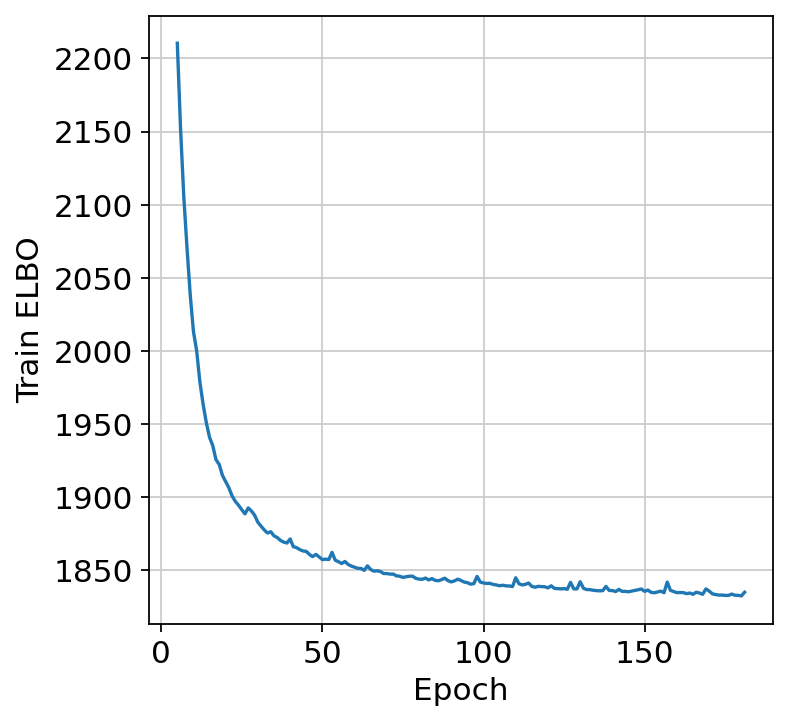

In [ ]:
plt.plot(model.history["elbo_train"].iloc[5:])
plt.xlabel("Epoch")
plt.ylabel("Train ELBO")
plt.show()

In [ ]:
#Saving the latent representation into the anndata object
SCVI_LATENT_KEY = "X_scVI"
adata.obsm[SCVI_LATENT_KEY] = model.get_latent_representation()

In [ ]:
integrated_counts = model.get_normalized_expression(
    transform_batch='CMO301',
    library_size=10000,
    return_numpy=True
)

adata.layers["scvi_integrated"] = integrated_counts

##UMAP and General Analysis
---

In [ ]:
#Clustering based on the latent representation
sc.pp.neighbors(adata, use_rep=SCVI_LATENT_KEY, n_neighbors=int(np.log2(len(adata.obs_names))))
sc.tl.umap(adata, min_dist=0.15,random_state=42)
sc.tl.leiden(adata, resolution=0.45,random_state=42)

/tmp/ipython-input-2486194776.py:4: FutureWarning: The `igraph` implementation of leiden clustering is *orders of magnitude faster*. Set the flavor argument to (and install if needed) 'igraph' to use it.
In the future, the default backend for leiden will be igraph instead of leidenalg. To achieve the future defaults please pass: `flavor='igraph'` and `n_iterations=2`. `directed` must also be `False` to work with igraph’s implementation.
  sc.tl.leiden(adata, resolution=0.45,random_state=42)


In [ ]:
"""#Dictiornary connecting the tumors to the barcoding oligos

cmo_to_tumor = {'CMO301': '3341_T1',
               'CMO306': '3341_T2_TM2',
               'CMO302': '3336_T1',
               'CMO305': '3341_TM1',
               'CMO304': '3333_TM1',
               'CMO311': '3337_T1',
               'CMO308': '3343_T1',
               'CMO307': '3347_T1',
               'CMO309': '3346_T1',
               'CMO303': '3337_3353_TM1',
               'CMO310': '3347_TM1',
               'CMO312': '3346_TM1',
               }
cellbc_to_cmo = dict(cancer_adata.obs['CMO'])

cancer_adata.obs['tumor'] = cancer_adata.obs['CMO'].map(cmo_to_tumor)
cancer_adata.obs['mouse'] = cancer_adata.obs.apply(lambda x: x.tumor.split("_")[0], axis=1)"""

NameError: name 'cancer_adata' is not defined

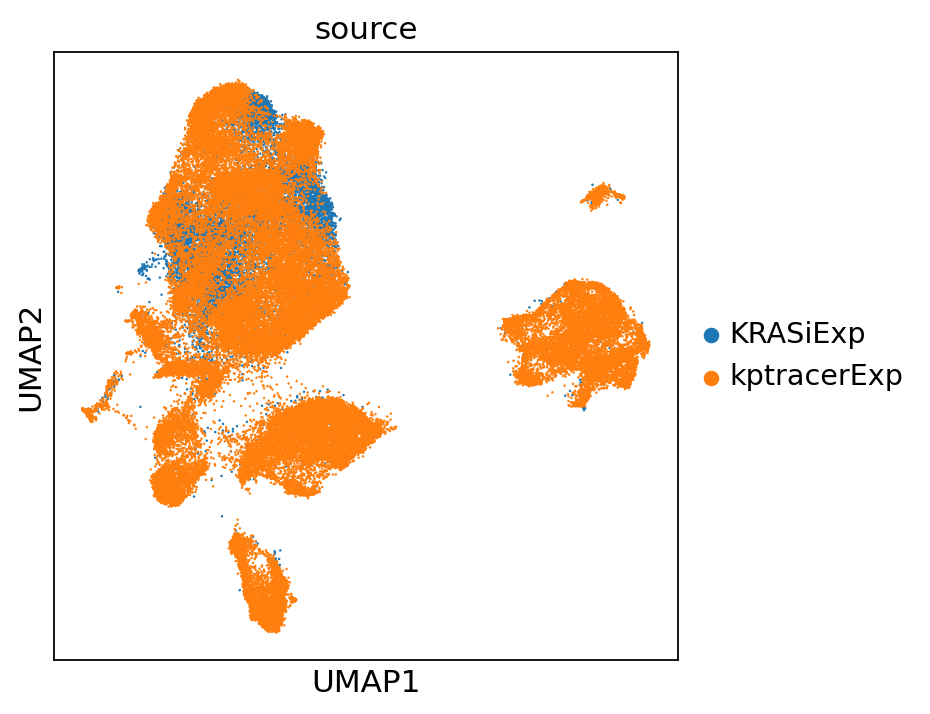

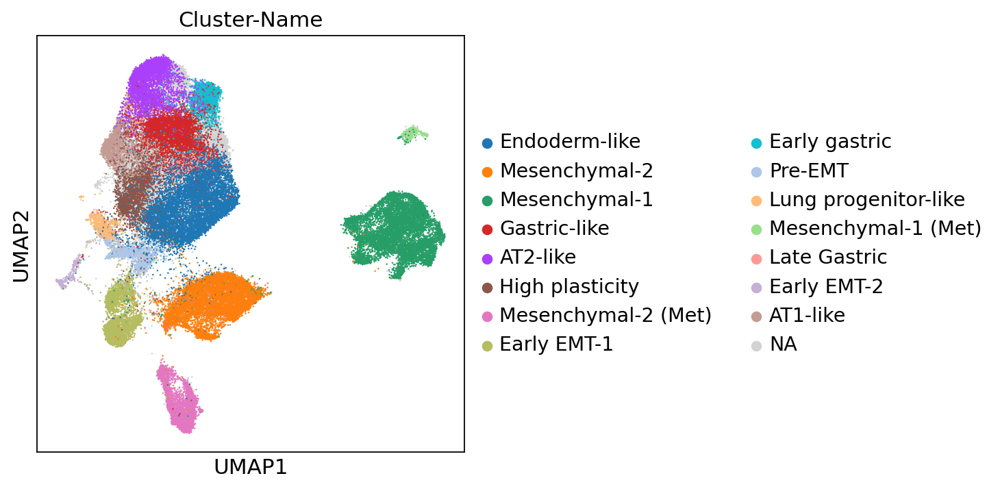

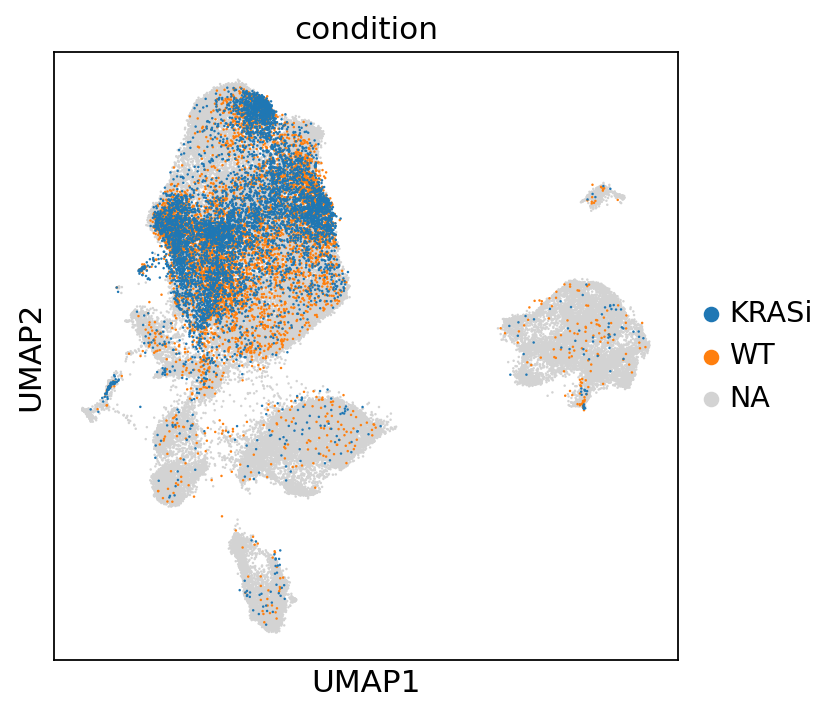

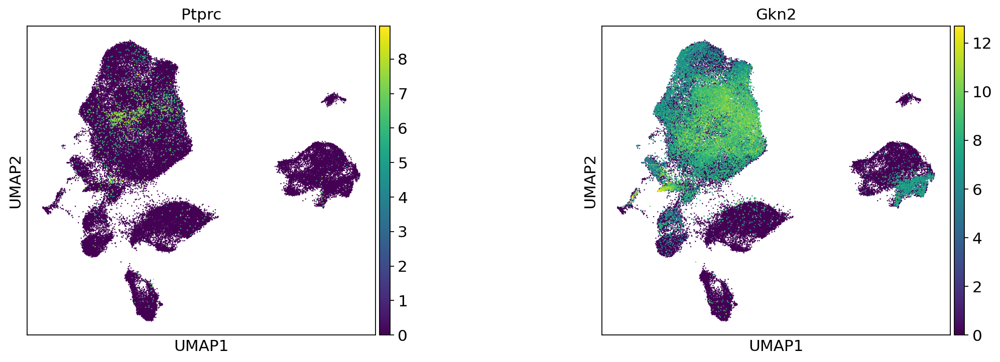

In [ ]:
#Example Plotting of the analysis
sc.set_figure_params(figsize=(5,5))
sc.pl.umap(adata, color=['source'], size=5, wspace=0.5,hspace=0.3)
sc.pl.umap(adata, color=['Cluster-Name'], size=5, wspace=0.5,hspace=0.3)
sc.pl.umap(adata, color=['condition'], size=5, wspace=0.5,hspace=0.3)
sc.pl.umap(adata, color=['Ptprc','Gkn2'], size=5, wspace=0.5,hspace=0.3, use_raw=False)



In [ ]:
adata

AnnData object with n_obs × n_vars = 70118 × 4000
    obs: 'CMO', 'TS-UMI', 'N_intBC', 'TS-ReadCount', 'N_unique_alleles', 'PercentUncut', 'condition', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'leiden', 'umap_density_condition', 'source', 'TS_Present', 'RNA_Present', 'MULTI', 'TS_UMI', 'NUM_INTBC', 'Lane', 'Tumor', 'SubTumor', 'ES_clone', 'genotype', 'Aging_time', 'Mouse', 'Aging_Month', 'Batch_Library', 'Batch_Harvest', 'Aging_Time', 'MetFamily', 'lentiBC', 'is_normal', 'n_counts', 'leiden_sub', 'Cluster-Name', 'batch_unified', '_scvi_batch', '_scvi_labels'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Cluster-Name_colors', '_scvi_manager_uuid', '_scvi_uuid', 'condition_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'source_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts', 'scvi_integrated'
    obsp: '

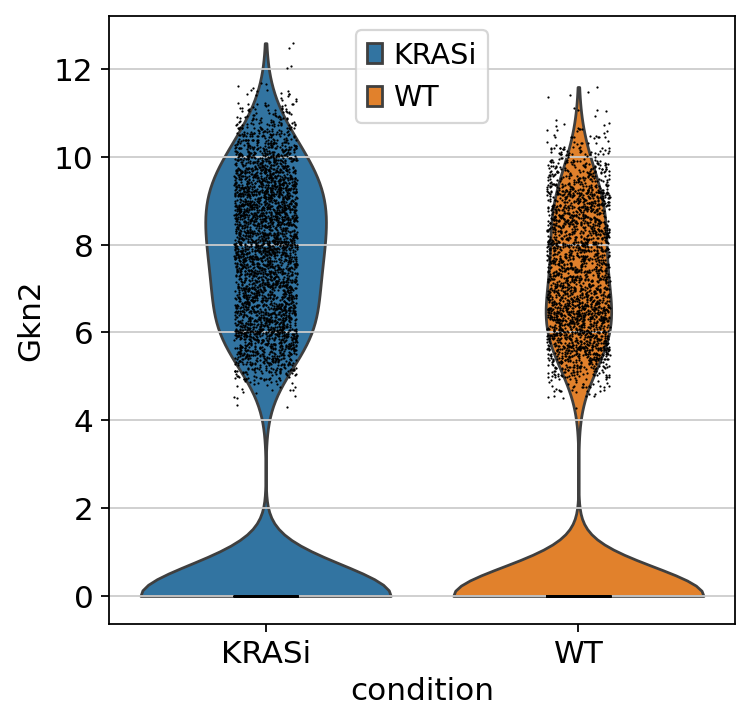

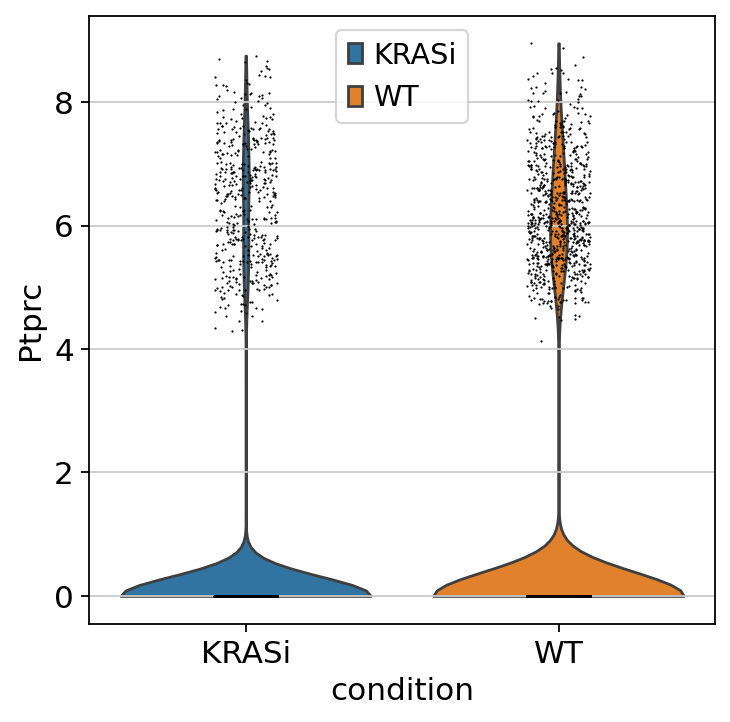

In [ ]:
sc.pl.violin(adata, keys=['Gkn2'], groupby='condition', use_raw=False)
sc.pl.violin(adata, keys=['Ptprc'], groupby='condition', use_raw=False)


In [ ]:
#Saving the model and data

model.save("/content/drive/MyDrive/Rotations/Jones Lab/Data/scvi02022025/", overwrite=True)
model.save("/content/drive/MyDrive/Rotations/Jones Lab/Data/scvi020225/", overwrite=True, save_anndata=True)
sc.write('/content/drive/MyDrive/Rotations/Jones Lab/Data/cancer_KPTracer.2026.scvi.h5ad', adata, compression='gzip')

**Cellular Programs**

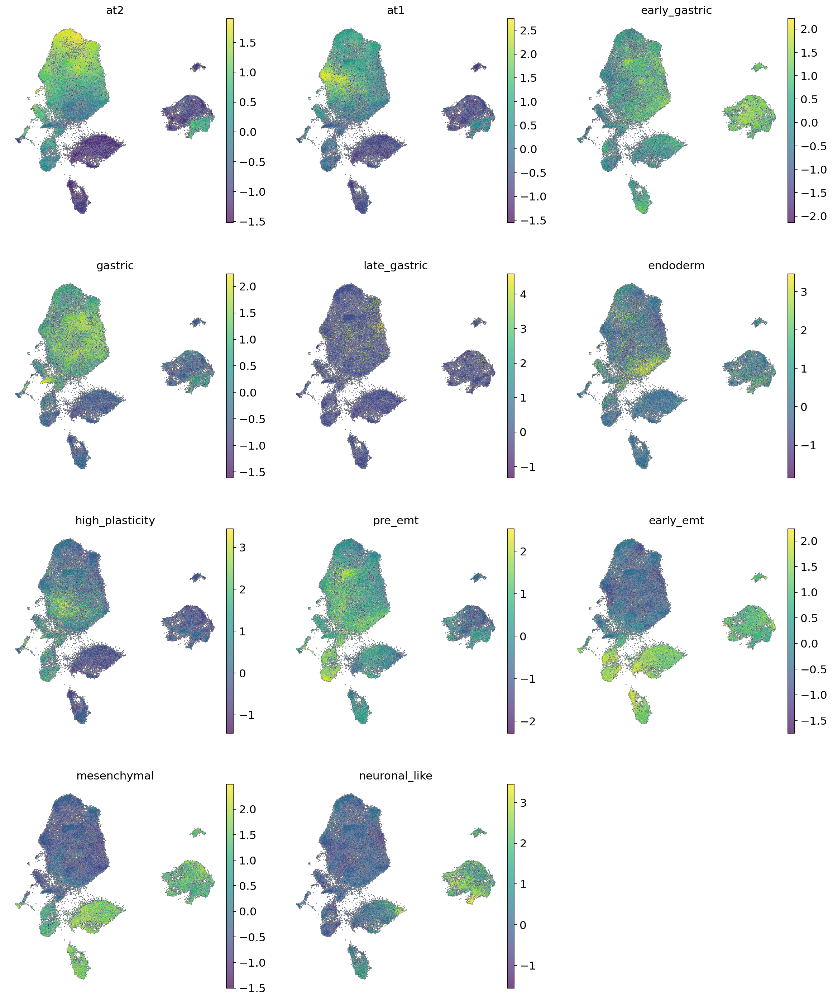

In [ ]:
at2_programs = ['Sftpa1', 'Sftpb', 'Sftpc', 'Sftpd', 'Cxcl15', 'Lyz2', 'Cd74']
at1_programs = ['Hopx', 'Ager', 'Pdpn', 'Aqp5', 'Clic5']
early_gastric = ['Cacna1a', 'Fmo1', 'Kng2', 'Pim1', 'Gm29340', 'Meg3']
gastric_like = ['Hs3st5', 'Kctd8', 'Clstn2', 'Gkn2']
late_gastric = ['Sfmbt2', 'Chrna9', 'Kcnq5', 'Rlbp1', 'Shisa9', 'Fras1', 'Folr1', 'Agxt2', 'Ppp1r3a']
endoderm_like = ['Pyy', 'Spatc1', 'Hccs', 'Hif3a', 'Col15a1']
high_plasticity = ['Akr1d1', 'Mcpt1', 'Mcpt2', 'Mroh4', 'Tmem266', 'Vstm5', 'Dysf', 'Cldn2', 'Procr']
pre_emt = ['Ntm', 'Clu', 'Onecut3', 'Rmst', 'Fn1', 'Lmcd1', 'Ccbe1']
early_emt = ['Tg', 'Dock10', 'Cenpe', 'Top2a', 'Vim', 'Fbln2', 'Zeb2', 'Hmga2', 'Lgals1', 'Inhba']
mesenchymal = ['Vim', 'Zeb1', 'Zeb2', 'Twist1', 'Tgfb1']
neuronal_like = ['Ldb2', 'Calcrl', 'Cyyr1', 'Piezo2', 'Fgd2', 'Sparcl1', 'Shank3', 'Vwf', 'Acer2', 'Ebf1', 'Robo1', 'Robo2']

program_names = ['at2', 'at1', 'early_gastric', 'gastric', 'late_gastric', 'endoderm',
                 'high_plasticity', 'pre_emt', 'early_emt', 'mesenchymal', 'neuronal_like']

programs = [at2_programs, at1_programs, early_gastric, gastric_like, late_gastric, endoderm_like,
            high_plasticity, pre_emt, early_emt, mesenchymal, neuronal_like]


for program_name, program in zip(program_names, programs):
    sc.tl.score_genes(adata,
                      program,
                      ctrl_size=len(program), n_bins=30,
                      score_name=program_name, use_raw=False)

    adata.obs[program_name] = (adata.obs[program_name] - adata.obs[program_name].mean()) / adata.obs[program_name].std()


sc.pl.umap(
    adata,
    color=program_names,
    frameon=False,
    ncols=3,
    vmin='p1',
    vmax='p99',
    add_outline=True
)

**cNMF**

In [ ]:
import os
print(f"Total CPUs (os): {os.cpu_count()}")

Total CPUs (os): 24


In [ ]:
adata =sc.read_h5ad('/content/drive/MyDrive/Rotations/Jones Lab/Data/cancer_KPTracer.2026.scvi.h5ad')



KeyboardInterrupt: 

In [ ]:
adata_hvg = adata[:, adata.var.highly_variable].copy()

integrated_adata = sc.AnnData(X=adata_hvg.layers['scvi_integrated'], obs=adata_hvg.obs, var=adata_hvg.var)
integrated_adata.write("./cnmf_input_integrated.h5ad")

raw_counts_adata = sc.AnnData(X=adata_hvg.layers['counts'], obs=adata_hvg.obs, var=adata_hvg.var)
raw_counts_adata.write("./cnmf_raw_counts.h5ad")

In [ ]:
cnmf_obj = cNMF(output_dir="./cnmf_resultsKPTracer", name="scVI_integrated_cNMF")




In [ ]:
cnmf_obj.prepare(
    counts_fn="./cnmf_raw_counts.h5ad",
    tpm_fn="./cnmf_input_integrated.h5ad",
    components=np.arange(5,25),
    n_iter=50,
    seed=14,
    densify=True
)


In [ ]:
import multiprocessing as mp

def run_worker(worker_index):
    try:
        obj = cNMF(output_dir="./cnmf_resultsKPTracer", name="scVI_integrated_cNMF")
        obj.factorize(worker_i=worker_index, total_workers=23)
        return f"Worker {worker_index} Success"
    except Exception as e:
        return f"Worker {worker_index} Failed: {str(e)}"

if __name__ == '__main__':
    ctx = mp.get_context('fork')

    print("Starting 23 workers in parallel...")
    with ctx.Pool(processes=23) as pool:
        results = pool.map(run_worker, range(23))

    for res in results:
        print(res)

Starting 23 workers in parallel...
[Worker 12]. Starting task 12.
[Worker 6]. Starting task 6.
[Worker 2]. Starting task 2.[Worker 11]. Starting task 11.

[Worker 1]. Starting task 1.
[Worker 0]. Starting task 0.[Worker 15]. Starting task 15.

[Worker 22]. Starting task 22.
[Worker 13]. Starting task 13.
[Worker 5]. Starting task 5.[Worker 14]. Starting task 14.

[Worker 21]. Starting task 21.[Worker 4]. Starting task 4.

[Worker 17]. Starting task 17.
[Worker 16]. Starting task 16.[Worker 20]. Starting task 20.[Worker 10]. Starting task 10.

[Worker 8]. Starting task 8.

[Worker 19]. Starting task 19.[Worker 7]. Starting task 7.

[Worker 3]. Starting task 3.
[Worker 18]. Starting task 18.
[Worker 9]. Starting task 9.
[Worker 22]. Starting task 45.
[Worker 5]. Starting task 28.
[Worker 20]. Starting task 43.
[Worker 8]. Starting task 31.
[Worker 12]. Starting task 35.
[Worker 2]. Starting task 25.
[Worker 21]. Starting task 44.
[Worker 0]. Starting task 23.
[Worker 16]. Starting task 3

Combining factorizations for k=5.
Combining factorizations for k=6.
Combining factorizations for k=7.
Combining factorizations for k=8.
Combining factorizations for k=9.
Combining factorizations for k=10.
Combining factorizations for k=11.
Combining factorizations for k=12.
Combining factorizations for k=13.
Combining factorizations for k=14.
Combining factorizations for k=15.
Combining factorizations for k=16.
Combining factorizations for k=17.
Combining factorizations for k=18.
Combining factorizations for k=19.
Combining factorizations for k=20.
Combining factorizations for k=21.
Combining factorizations for k=22.
Combining factorizations for k=23.
Combining factorizations for k=24.


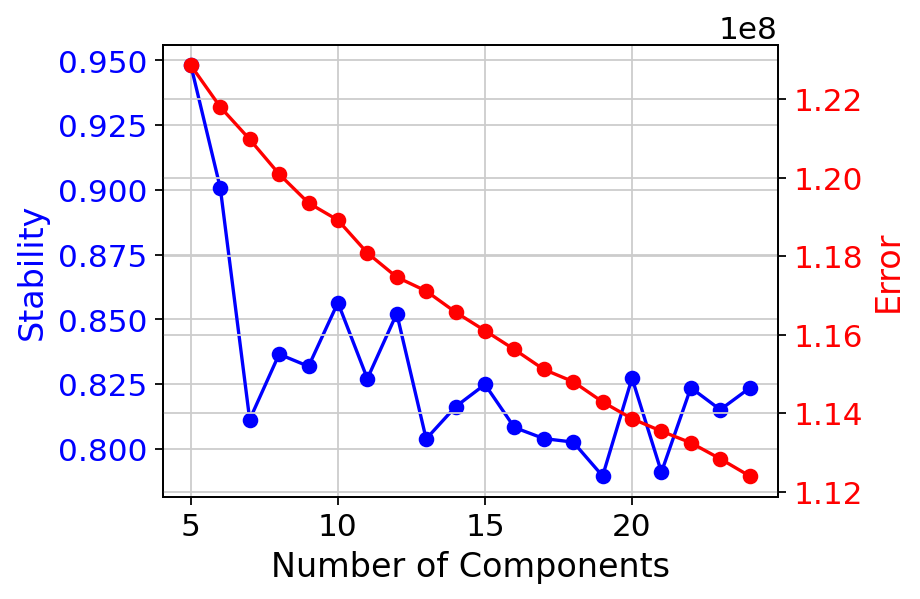

In [ ]:
cnmf_obj.combine()
cnmf_obj.k_selection_plot()

/usr/local/lib/python3.12/dist-packages/cnmf/cnmf.py:969: ImplicitModificationWarning: Modifying `X` on a view results in data being overridden
  norm_tpm.X /= norm_tpm.X.std(axis=0, ddof=1)


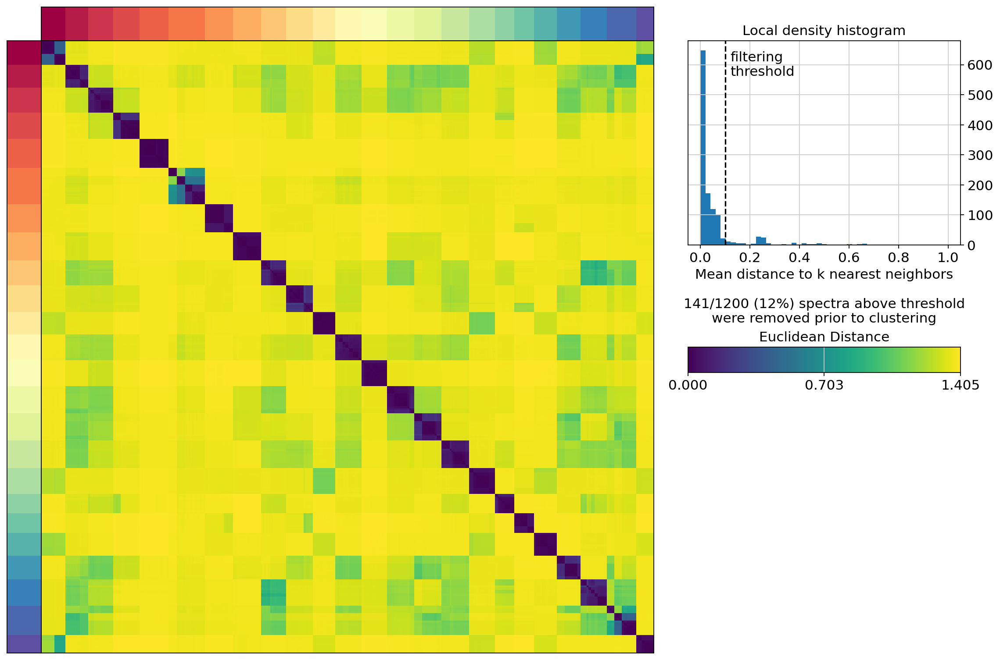

In [ ]:
k_selected = 24
cnmf_obj.consensus(k=k_selected, density_threshold=0.1,show_clustering=True, close_clustergram_fig=False)





In [ ]:
usage, spectra_scores, spectra_tpm, top_genes = cnmf_obj.load_results(K=k_selected, density_threshold=0.1)

In [ ]:
#Re-loading the results
cnmf_obj = cNMF(output_dir="./cnmf_results", name="KRASi_analysis")
usage, spectra_scores, spectra_tpm, top_genes = cnmf_obj.load_results(
    K=8,
    density_threshold=0.1
)

/tmp/ipython-input-3446333939.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_usage = usage_with_meta.groupby('condition').mean()


Programs ranked by KRASi specificity:
condition      KRASi        WT  fold_change
Program 3   0.164372  0.101175     1.624623
Program 6   0.141731  0.098046     1.445540
Program 12  0.029631  0.022910     1.293313
Program 16  0.016155  0.013924     1.160138
Program 10  0.080812  0.075536     1.069833
Program 8   0.020174  0.019030     1.060048
Program 5   0.126745  0.125723     1.008120
Program 7   0.020325  0.020240     1.004146
Program 17  0.048085  0.049412     0.973139
Program 14  0.063020  0.069057     0.912571
Program 20  0.007981  0.009048     0.881900
Program 15  0.019105  0.021819     0.875588
Program 1   0.075977  0.089680     0.847194
Program 18  0.011226  0.013606     0.825059
Program 9   0.020316  0.025094     0.809562
Program 19  0.010466  0.013217     0.791812
Program 2   0.027032  0.035178     0.768402
Program 13  0.069597  0.102347     0.679999
Program 4   0.011941  0.018252     0.654212
Program 11  0.035309  0.076708     0.460304


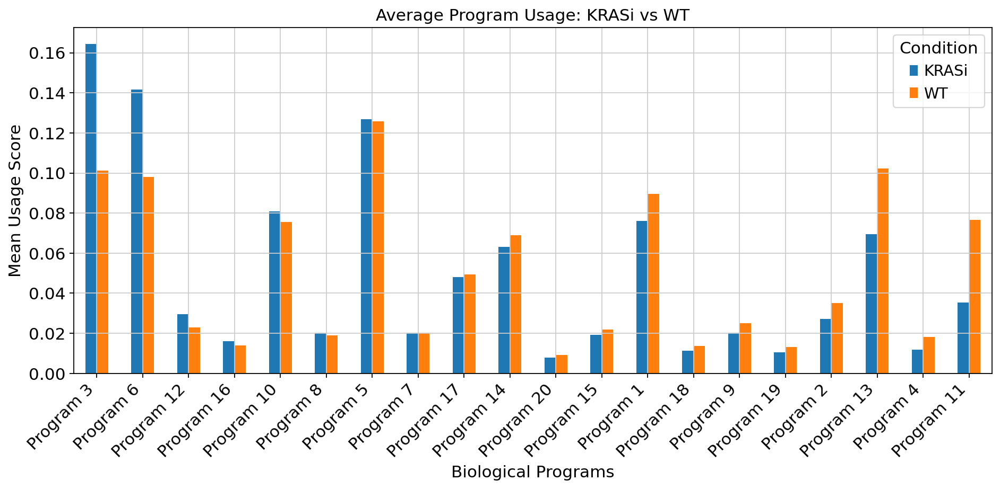

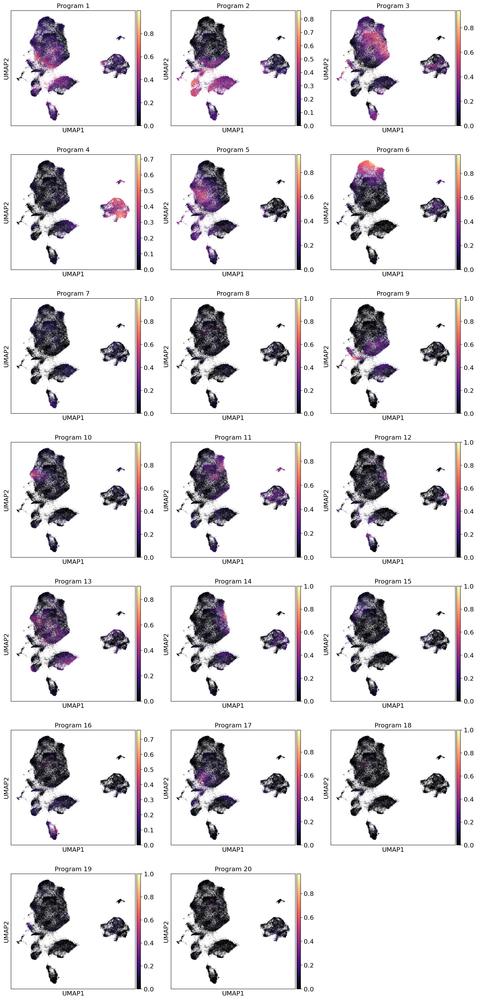

In [ ]:
# 0. Define the mapping
program_map = {
    1: 'Program 1',
    2: 'Program 2',
    3: 'Program 3',
    4: 'Program 4',
    5: 'Program 5',
    6: 'Program 6',
    7: 'Program 7',
    8: 'Program 8',
    9: 'Program 9',
    10: 'Program 10',
    11: 'Program 11',
    12: 'Program 12',
    13: 'Program 13',
    14: 'Program 14',
    15: 'Program 15',
    16: 'Program 16',
    17: 'Program 17',
    18: 'Program 18',
    19: 'Program 19',
    20: 'Program 20',
}


adata_nmf = adata[usage.index, :].copy()
usage_with_meta = usage.copy()
usage_with_meta['condition'] = adata.obs['condition'].values

avg_usage = usage_with_meta.groupby('condition').mean()
comparison = avg_usage.T

comparison.index = comparison.index.map(program_map)

comparison['fold_change'] = comparison['KRASi'] / (comparison['WT'] + 1e-6)
comparison = comparison.sort_values('fold_change', ascending=False)

print("Programs ranked by KRASi specificity:")
print(comparison)

comparison[['KRASi', 'WT']].plot(kind='bar', figsize=(12, 6))
plt.title('Average Program Usage: KRASi vs WT')
plt.ylabel('Mean Usage Score')
plt.xlabel('Biological Programs')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Condition')
plt.tight_layout()
plt.show()

for prog_id, prog_name in program_map.items():
    adata_nmf.obs[prog_name] = usage[prog_id]

program_names = list(program_map.values())

sc.pl.umap(adata_nmf, color=program_names, cmap='magma', ncols=3)

/tmp/ipython-input-2013162206.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_usage = adata_nmf.obs.groupby('Cluster-Name')[program_names].mean()


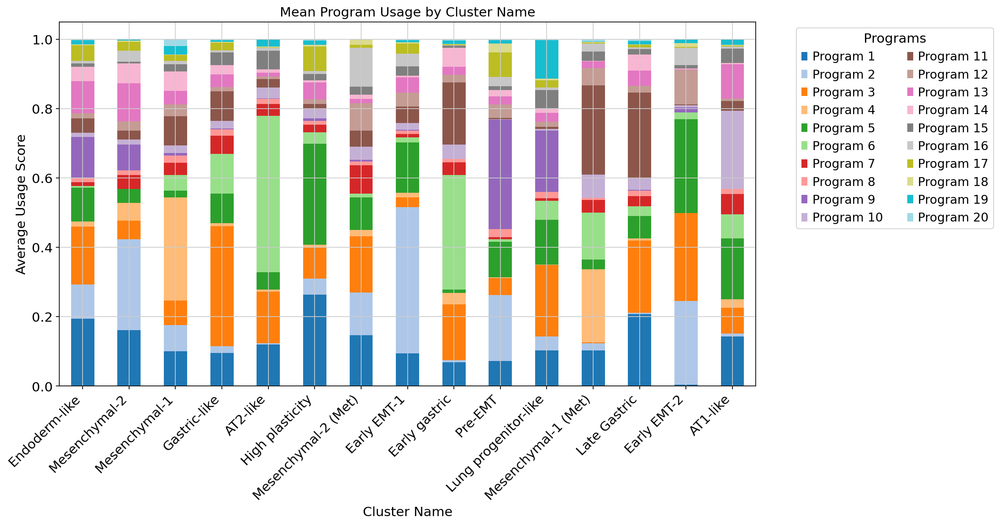

In [ ]:
cluster_usage = adata_nmf.obs.groupby('Cluster-Name')[program_names].mean()


cluster_usage.plot(kind='bar', stacked=True, figsize=(15, 8), colormap='tab20')

plt.title('Mean Program Usage by Cluster Name')
plt.xlabel('Cluster Name')
plt.ylabel('Average Usage Score')
plt.legend(title='Programs', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
cmo_to_tumor = {
    'CMO301': '3341_T1', 'CMO306': '3341_T2_TM2', 'CMO302': '3336_T1',
    'CMO305': '3341_TM1', 'CMO304': '3333_TM1', 'CMO311': '3337_T1',
    'CMO308': '3343_T1', 'CMO307': '3347_T1', 'CMO309': '3346_T1',
    'CMO303': '3337_3353_TM1', 'CMO310': '3347_TM1', 'CMO312': '3346_TM1'
}


adata_nmf.obs['tumor'] = cancer_adata_cnmf.obs['CMO'].map(cmo_to_tumor)
cancer_adata_cnmf.obs['mouse'] = cancer_adata_cnmf.obs['tumor'].str.split('_').str[0]


baseline_tb_map = {
    '3341_T1': 'High', '3341_T2_TM2': 'High', '3341_TM1': 'High',
    '3336_T1': 'Low',
    '3333_TM1': 'Medium',
    '3343_T1': 'High',
    '3346_T1': 'High', '3346_TM1': 'High',
    '3347_T1': 'Medium', '3347_TM1': 'Medium',
    '3337_T1': 'High', '3337_3353_TM1': 'High'
}

sample_type_map = {
    '3341_T1': 'Tumor', '3341_T2_TM2': 'Tumor', '3341_TM1': 'Tumor Mix',
    '3336_T1': 'Tumor',
    '3333_TM1': 'Tumor Mix',
    '3343_T1': 'Tumor',
    '3346_T1': 'Tumor', '3346_TM1': 'Tumor Mix',
    '3347_T1': 'Tumor', '3347_TM1': 'Tumor Mix',
    '3337_T1': 'Tumor', '3337_3353_TM1': 'Tumor Mix'
}

cancer_adata_cnmf.obs['baseline_tb'] = cancer_adata_cnmf.obs['tumor'].map(baseline_tb_map)
cancer_adata_cnmf.obs['sample_type'] = cancer_adata_cnmf.obs['tumor'].map(sample_type_map)


cancer_adata_cnmf.obs['baseline_tb'] = cancer_adata_cnmf.obs['baseline_tb'].astype('category')
cancer_adata_cnmf.obs['sample_type'] = cancer_adata_cnmf.obs['sample_type'].astype('category')

In [ ]:




sc.pl.dotplot(
    cancer_adata_cnmf,
    var_names=program_names,
    groupby=['baseline_tb','condition'],
    cmap='Purples',
    standard_scale='var',
    colorbar_title='Relative Usage',
)



sc.pl.dotplot(
    cancer_adata_cnmf,
    var_names=program_names,
    groupby=['sample_type', 'condition'],
    cmap='Purples',
    standard_scale='var',
    colorbar_title='Relative Usage',
)

sc.tl.dendrogram(
    cancer_adata_cnmf,
    groupby='tumor',
    use_rep=None,
    var_names=program_names
)

sc.pl.matrixplot(
    cancer_adata_cnmf,
    var_names=program_names,
    groupby='tumor',
    cmap='Purples',
    standard_scale='var',
    colorbar_title='Relative Usage',
    dendrogram=True
)

In [ ]:

program_usage = adata.obs[program_names]
corr_matrix = program_usage.corr(method='pearson')
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='RdBu_r', center=0)
plt.title('Program Correlation Matrix')
plt.show()

KeyError: "None of [Index(['Program 1', 'Program 2', 'Program 3', 'Program 4', 'Program 5',\n       'Program 6', 'Program 7', 'Program 8', 'Program 9', 'Program 10',\n       'Program 11', 'Program 12', 'Program 13', 'Program 14', 'Program 15',\n       'Program 16', 'Program 17', 'Program 18', 'Program 19', 'Program 20'],\n      dtype='object')] are in the [columns]"

In [ ]:



x_raw = cancer_adata_cnmf.obs['Injury Response/PATS Program'] - cancer_adata_cnmf.obs['AT2-like']
y_raw = cancer_adata_cnmf.obs['High Plasticity (Dlk1-Dio3+)'] - cancer_adata_cnmf.obs['Gastric-like/Cholesterol Metabolism']

rotation_factor = np.sqrt(2) / 2
cancer_adata_cnmf.obs['quadrant_x'] = (x_raw - y_raw) * rotation_factor
cancer_adata_cnmf.obs['quadrant_y'] = (x_raw + y_raw) * rotation_factor

plt.figure(figsize=(8, 8))

sc.pl.scatter(
    cancer_adata_cnmf,
    x='quadrant_x',
    y='quadrant_y',
    color=['sample_type'],
    size=10,
    alpha=0.6,
    show=False
)



limit = 0.8
plt.xlim(-limit, limit)
plt.ylim(-limit, limit)
plt.axis('off')

plt.text(0.75, 0.75, '100%\nInjury Response/PATS Program', ha='center', va='center', fontweight='bold', color='darkred')
plt.text(-0.75, -0.75, '100%\nAT2-like', ha='center', va='center', fontweight='bold', color='darkblue')
plt.text(-0.75, 0.75, '100%\nHigh Plasticity (Dlk1-Dio3+)', ha='center', va='center', fontweight='bold', color='darkgreen')
plt.text(0.75, -0.75, '100%\nGastric-like/Cholesterol Metabolism', ha='center', va='center', fontweight='bold', color='orange')


plt.show()

In [ ]:

x_raw = cancer_adata_cnmf.obs['Injury Response/PATS Program'] - cancer_adata_cnmf.obs['AT2-like']
y_raw = cancer_adata_cnmf.obs['High Plasticity (Dlk1-Dio3+)'] - cancer_adata_cnmf.obs['Gastric-like/Cholesterol Metabolism']

rotation_factor = np.sqrt(2) / 2
cancer_adata_cnmf.obs['quadrant_x'] = (x_raw - y_raw) * rotation_factor
cancer_adata_cnmf.obs['quadrant_y'] = (x_raw + y_raw) * rotation_factor


tumors = cancer_adata_cnmf.obs['tumor'].unique()
ncols = 6
nrows = 2

fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows))
axes = axes.flatten()
limit = 0.8

for i, tumor in enumerate(cancer_adata_cnmf.obs['tumor'].unique()):
    ax = axes[i]
    subset = cancer_adata_cnmf[cancer_adata_cnmf.obs['tumor'] == tumor]

    sc.pl.scatter(
        subset,
        x='quadrant_x',
        y='quadrant_y',
        color='condition',
        size=15,
        alpha=0.7,
        ax=ax,
        show=False,
        legend_loc='none'
    )

    ax.set_xlim(-limit, limit)
    ax.set_ylim(-limit, limit)

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")


    #ax.text(0.9, 0.81, '100%\nInjury Response\nPATS Program', ha='center', fontweight='bold', color='darkred', fontsize=8)
    #ax.text(-0.92, -0.9, '100%\nAT2-like', ha='center', fontweight='bold', color='darkblue', fontsize=8)
    #ax.text(-0.92, 0.81, '100%\nHigh Plasticity (Dlk1-Dio3+)', ha='center', fontweight='bold', color='darkgreen', fontsize=8)
    #ax.text(0.9, -0.9, '100%\nGastric-like/Cholesterol Metabolism', ha='center', fontweight='bold', color='orange', fontsize=8)

    ax.set_title(f"Tumor: {tumor}", fontsize=12)


plt.tight_layout()
plt.show()